# Kernels Functions

mldata.org dataset: mauna-loa-atmospheric-co2
Total: 468 | Obs: 98 (20.94017094017094%)


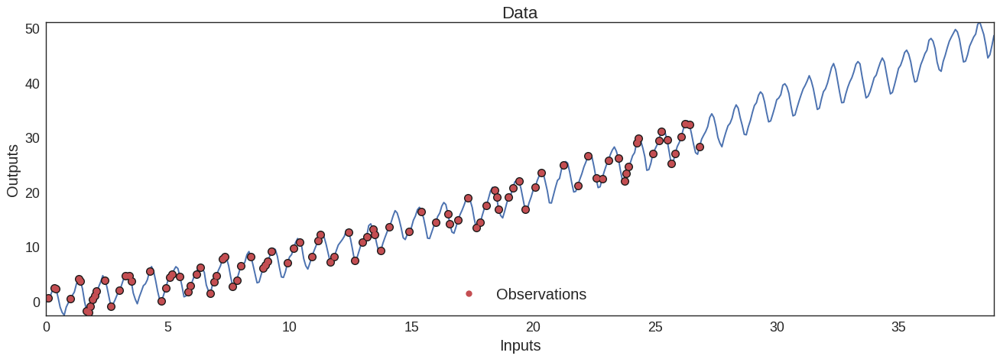

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import numpy as np
import g3py as g3

g3.style_normal()
name_data = 'MaunaLoaC02'
x, y = g3.data_co2()

x = x-x[0]
y = y-y[0]

obs_j, x_obs, y_obs, test_j, x_test, y_test = g3.random_obs(x, y, 0.3, 0.7, plot=True)

## Kernels in g3py:
* [Stationarity Kernels](#Stationarity-Kernels)
    * [WN: White Noise](#WN:-White-Noise)
    * [BW: Brownian](#BW:-Brownian)
    * [SE: Squared Exponential](#SE:-Squared-Exponential)
    * [OU: Ournstein Uhlenbeck](#OU:-Ournstein-Uhlenbeck)
    * [RQ: Rational Quadratic](#RQ:-Rational-Quadratic)
    * [MAT32: Matern 3/2](#MAT32:-Matern-3/2)
    * [MAT52: Matern 5/2](#MAT32:-Matern-5/2)
* [Dot Kernels](#Dot-Kernels)
    * [LIN: Linear](#LIN:-Linear)
    * [POL: Polinomial](#POL:-Polinomial)
    * [NN: Neuronal Network](#NN:-Neuronal-Network) (soon)
* [Periodics Kernels](#Periodics-Kernels)
    * [COS: Cosine](#COS:-Cosine)
    * [SIN: Sine](#SIN:-Sine)
    * [SM: Spectral Mixture](#SM:-Spectral-Mixture)
* [Composition Kernels](#Composition-Kernels)
    * [Sum Kernels](#Sum-Kernels)
    * [Sum Kernels](#Sum-Kernels)
    * [Shift Kernel](#Shift-Kernel)
    * [Scale Kernel](#Scale-Kernel)

In [2]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

def test_kernel(kernel):
    fig = g3.figure(None)
    gridspec.GridSpec(3,2)
    
    gp = g3.GP(space=x, location=g3.Zero(), kernel=kernel)#, file='models/02-'+name_data+'-'+kernel.name+'.g3')
    gp.describe(name_data+str(gp.f_kernel.name),'month','CO2')
    gp.set_space(x,y)
    gp.observed(x_obs,y_obs)
    g3.style_normal()
    
    plt.subplot2grid((3,2), (0,0))
    gp.plot(samples=5, data=False, prior=True, title='Prior')
    
    plt.subplot2grid((3,2), (1,0))
    gp.plot(samples=5, title='Posterior')
    
    gp.set_params(gp.find_MAP(points=2, display=False))
    
    plt.subplot2grid((3,2), (2,0))
    gp.plot(samples=5, title='Find MAP')
    
    plt.subplot2grid((3,2), (0,1))
    gp.plot_kernel()
    
    plt.subplot2grid((3,2), (1,1), colspan=1, rowspan=2)
    gp.plot_concentration(figsize=None, title='Find MAP Concentration')

    fig.set_figheight(12)
    fig.tight_layout()
    return gp

# Stationarity Kernels
## WN: White Noise

(468, 5)
(468, 5)
(468, 5)


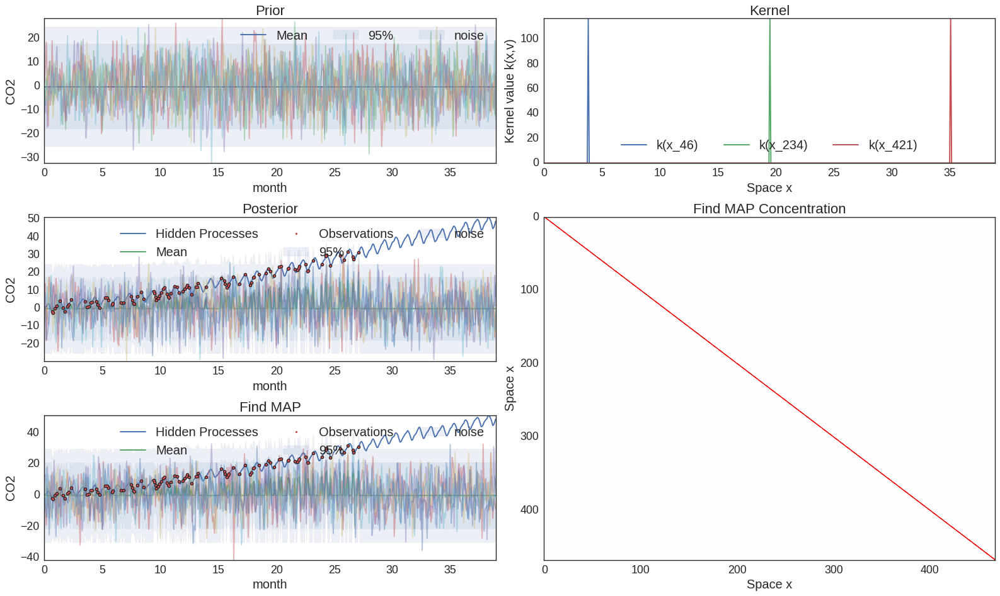

In [8]:
gp = test_kernel(g3.WN(x))

## BW: Brownian

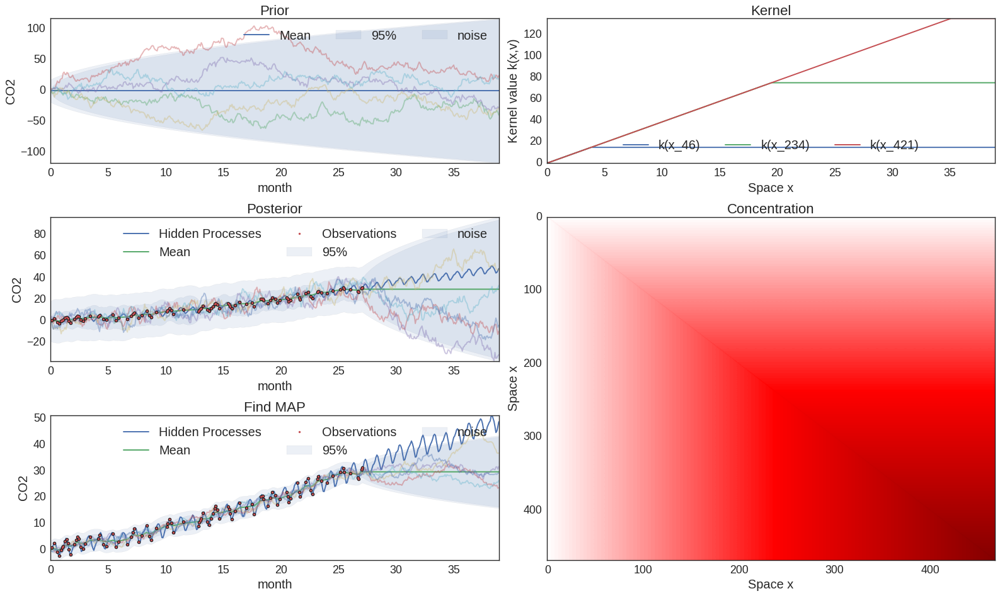

In [5]:
gp = test_kernel(g3.BW(x))

## SE: Squared Exponential

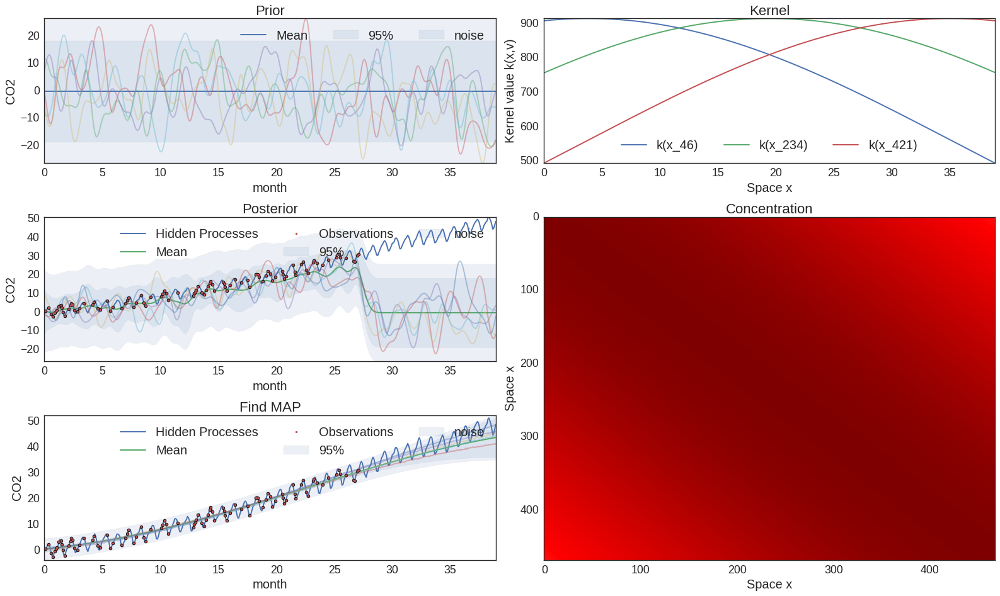

In [6]:
gp = test_kernel(g3.SE(x))

## OU: Ournstein-Uhlenbeck

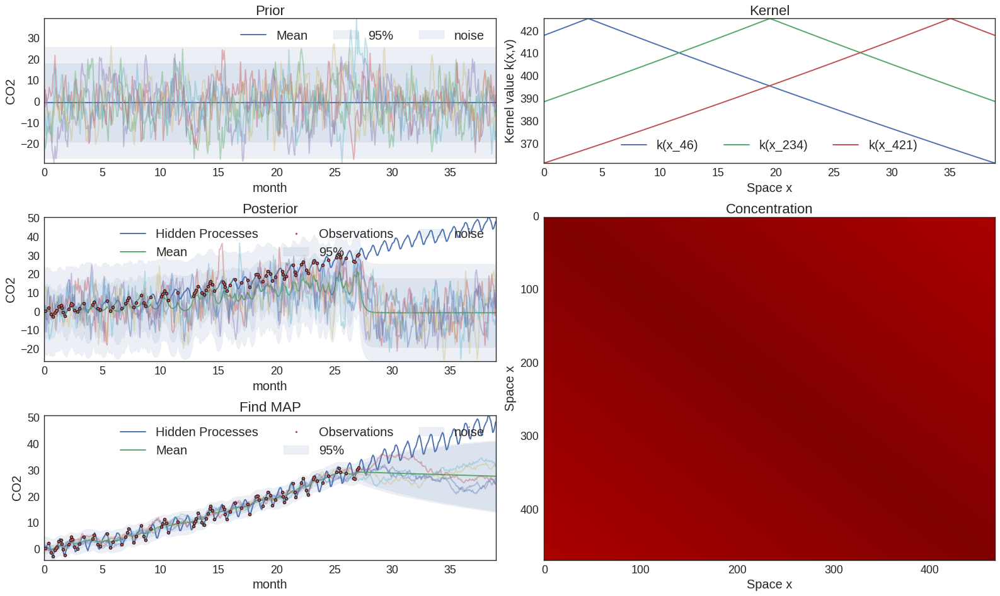

In [7]:
gp = test_kernel(g3.OU(x))

## RQ: Rational Quadratic

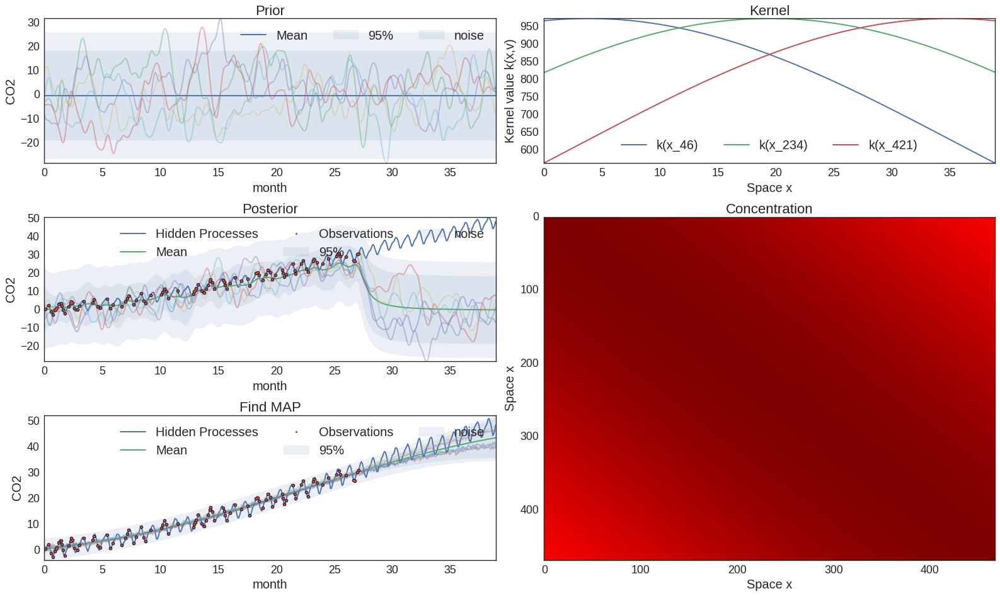

In [8]:
gp = test_kernel(g3.RQ(x))

## MAT32: Matern 3/2

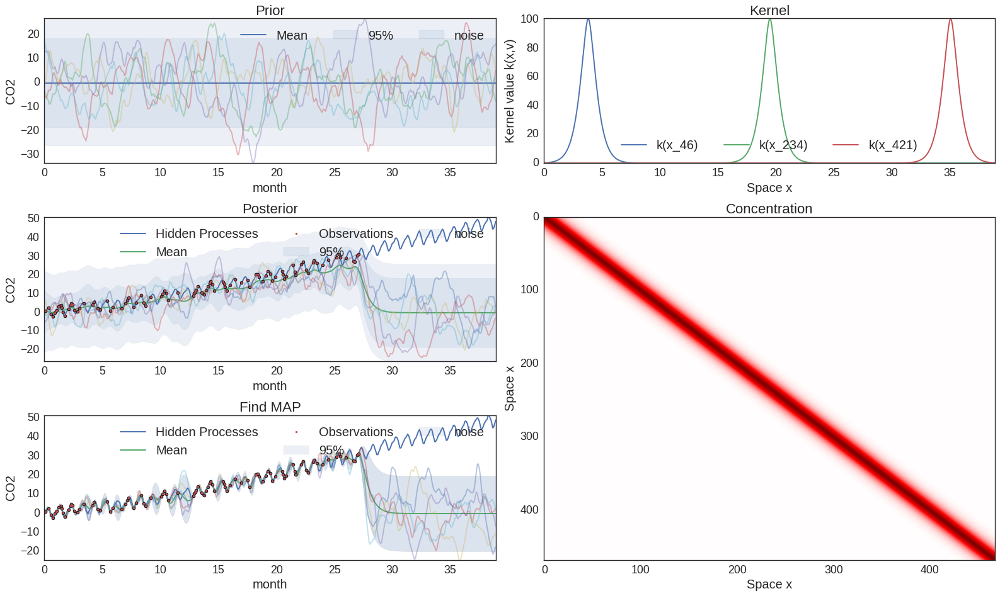

In [9]:
gp = test_kernel(g3.MAT32(x))

## MAT52: Matern 5/2

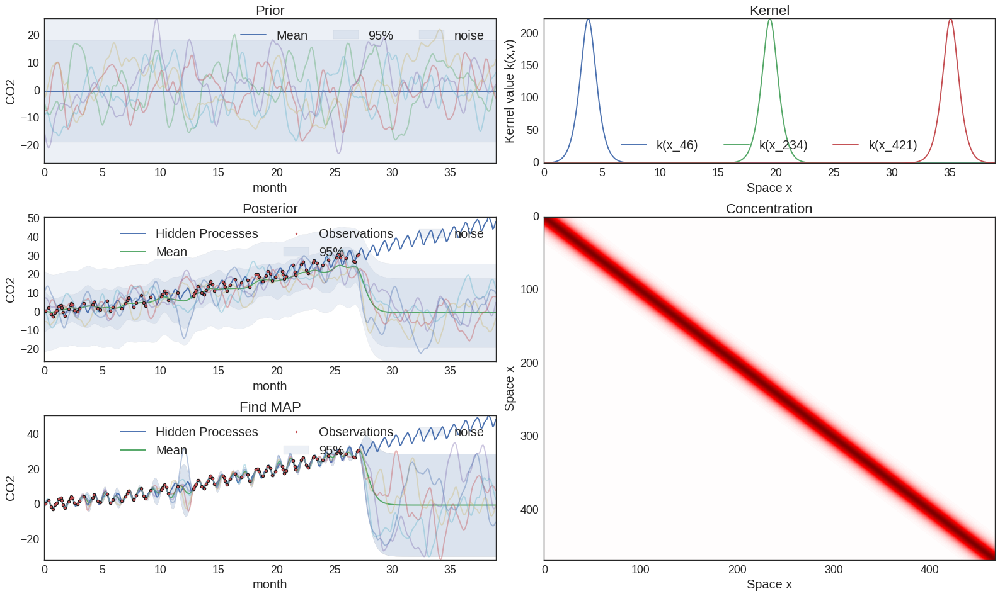

In [10]:
gp = test_kernel(g3.MAT52(x))

# Dot Kernels
## LIN: Linear

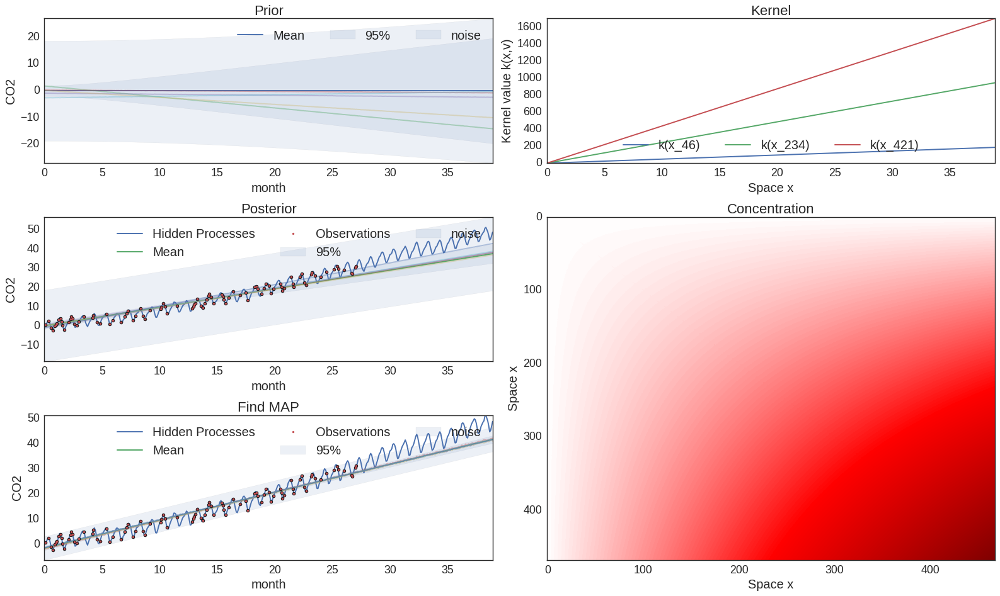

In [11]:
gp = test_kernel(g3.LIN(x))

## POL: Polinomial

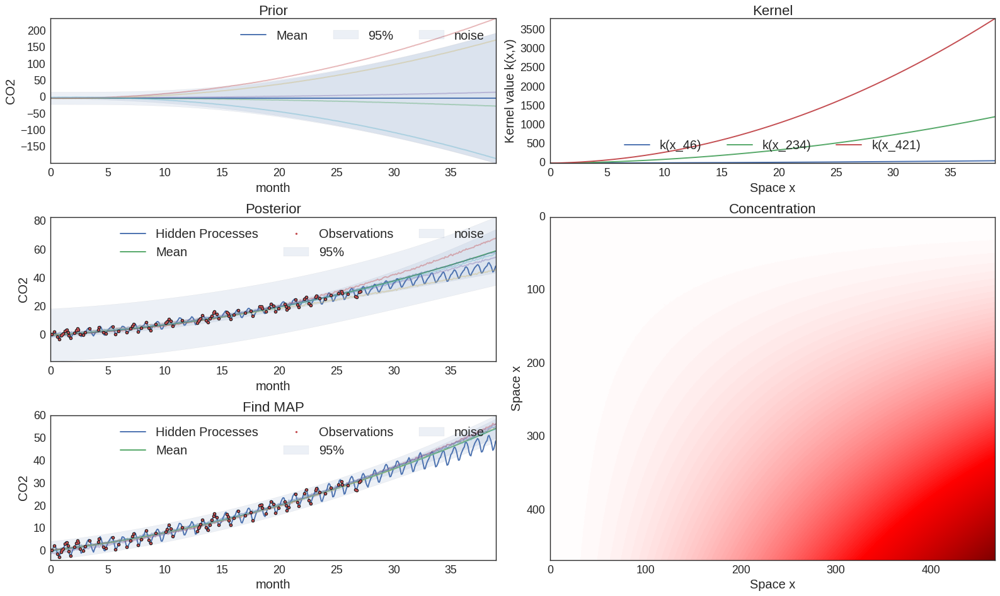

In [12]:
gp = test_kernel(g3.POL(x, 2))

## NN: Neuronal Net

In [13]:
#test_kernel_1D(g3.NN(x))

# Periodics Kernels
## COS: Cosine

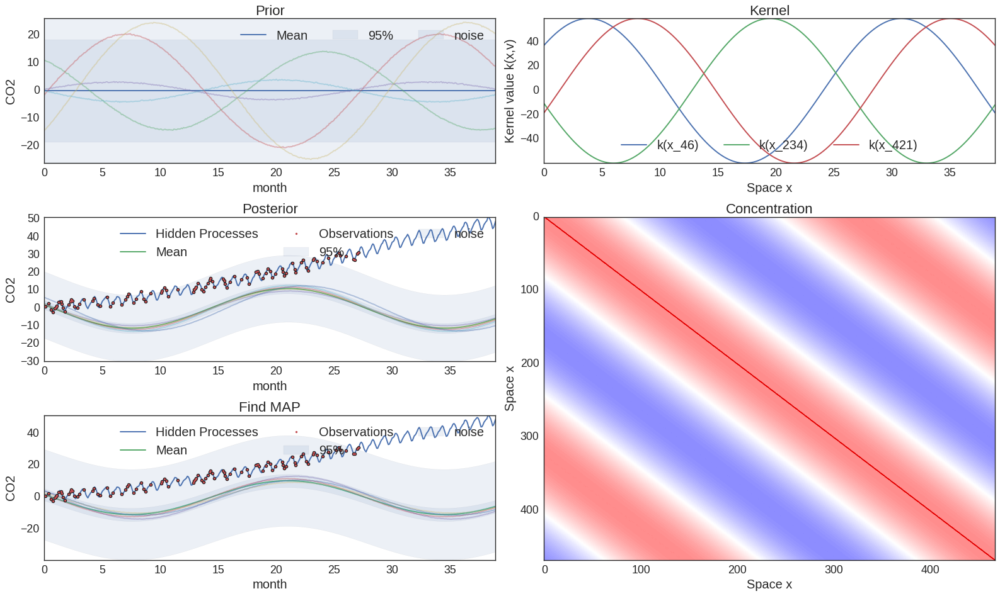

In [14]:
gp = test_kernel(g3.COS(x))

## SIN: Sine

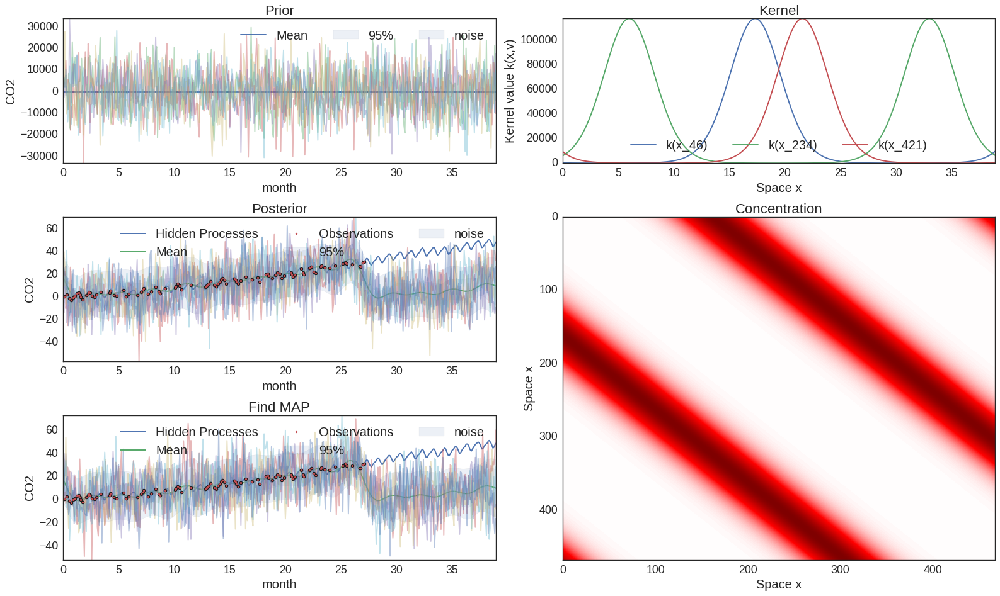

In [15]:
gp = test_kernel(g3.SIN(x))

## SM: Spectral Mixture

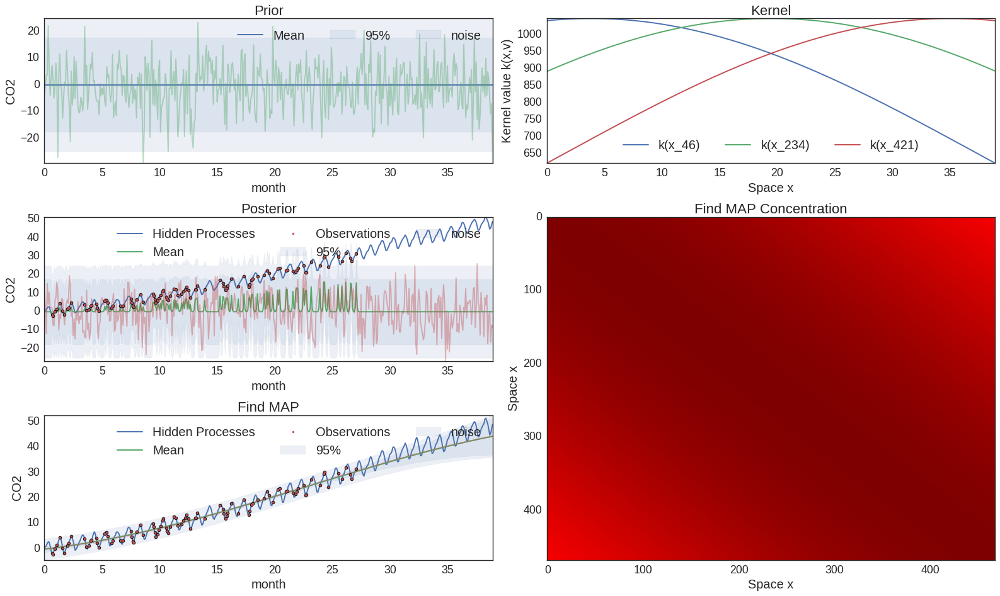

In [5]:
gp = test_kernel(g3.SM(x))

# Composition Kernels
## Mult Kernels

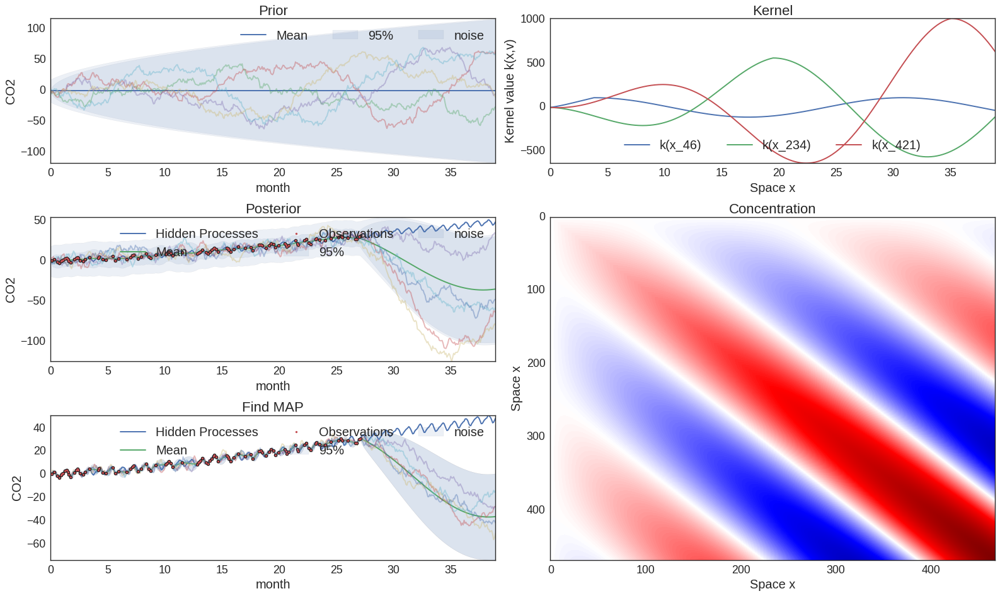

In [18]:
gp = test_kernel(g3.BW(x)*g3.COS(x))

## Sum Kernels

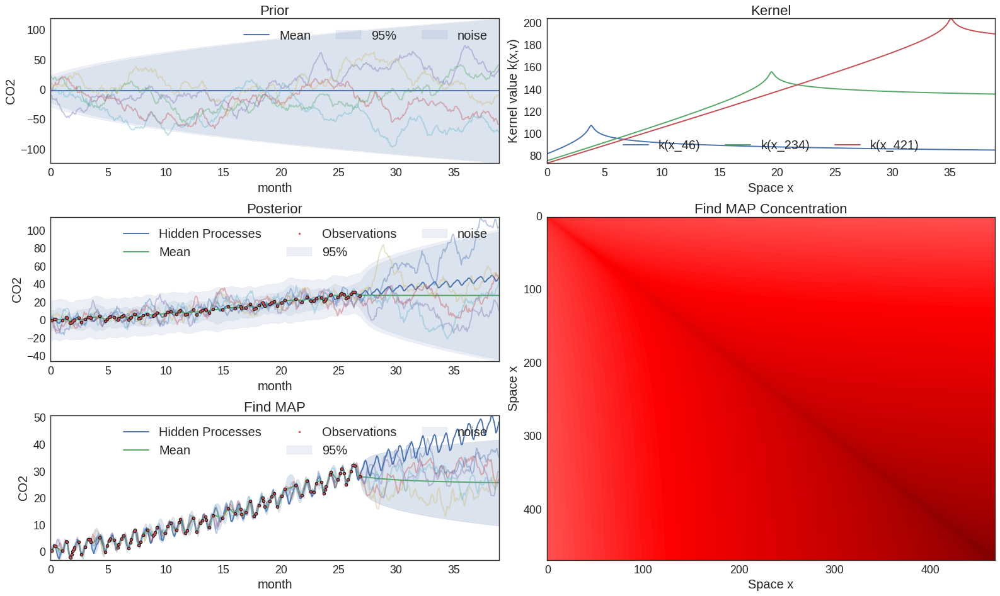

In [23]:
gp = test_kernel(g3.RQ(x) + g3.BW(x))

## Descomposition

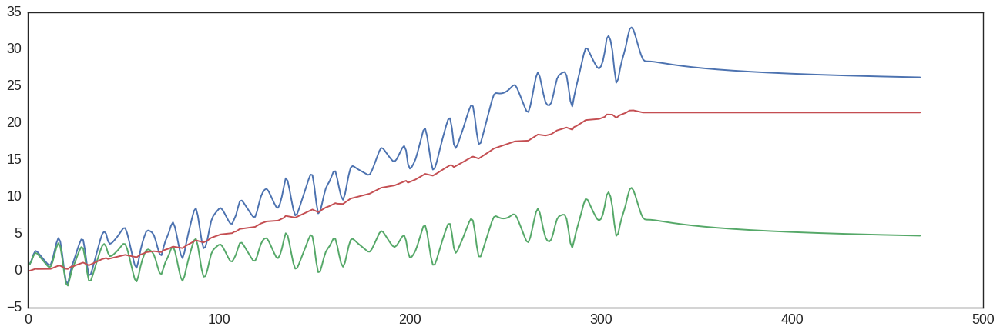

In [33]:
g3.plot(gp.predict().mean)
g3.plot(gp.cross_mean(cross_kernel=gp.f_kernel.k1))
g3.plot(gp.cross_mean(cross_kernel=gp.f_kernel.k2))

## Operations Kernels

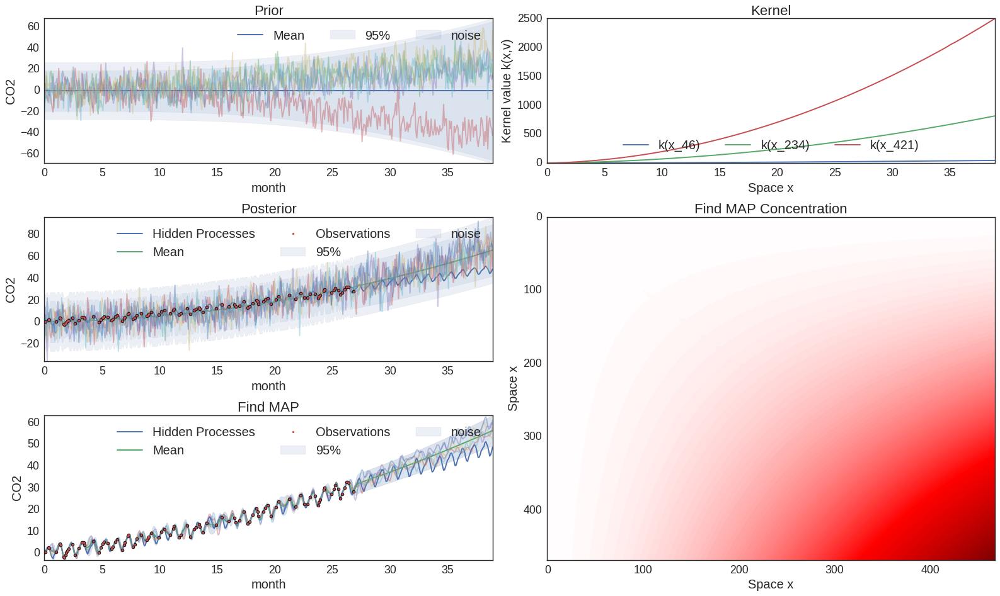

In [34]:
gp = test_kernel(0.1 * g3.POL(x) + g3.SM(x) * g3.RQ(x) + 1)

# Multidimensionals Kernels

In [4]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import g3py as g3
import numpy as np

x2 = np.linspace(-4, 4, 31)
y2 = np.linspace(-4, 4, 31)
xy, x2d, y2d = g3.grid2d(x2, y2)

def test_kernel_2D(kernel, subplot, noisy=False):
    gp = g3.GaussianProcess(space=xy, location=g3.Zero(), kernel=kernel, noisy=noisy)
    g3.plot_2d(gp.sample(), x2d, y2d, title=kernel.name, ax = fig.add_subplot(subplot, projection='3d'))

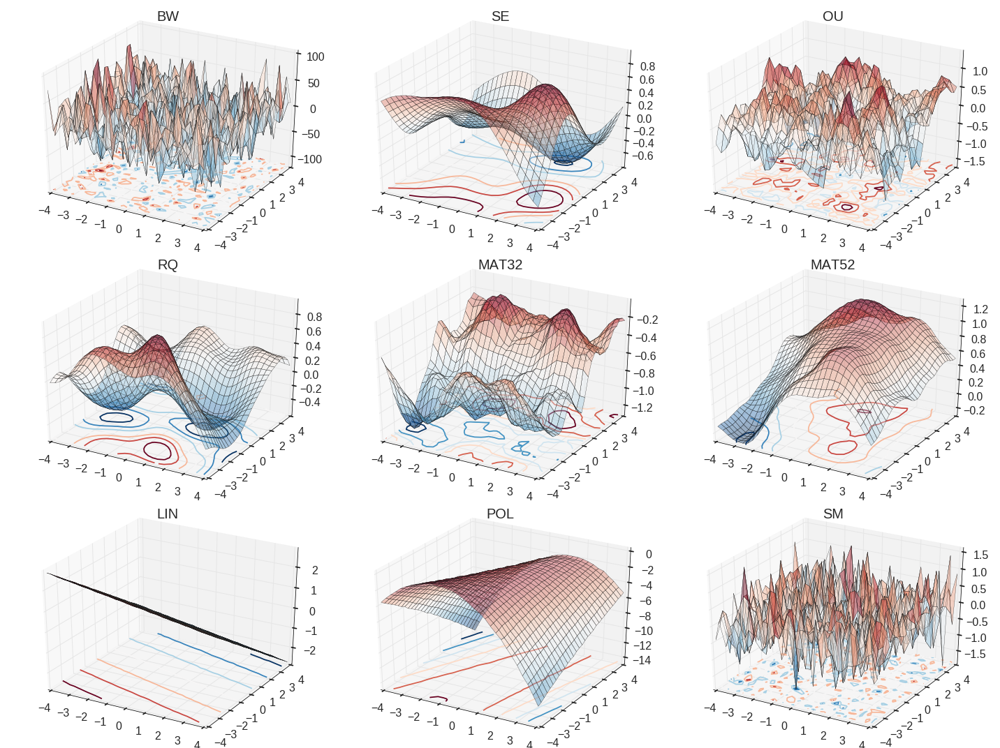

In [21]:
fig = g3.figure(figsize=[20, 15])

test_kernel_2D(g3.BW(), 331)
test_kernel_2D(g3.SE(), 332)
test_kernel_2D(g3.RQ(), 334)

test_kernel_2D(g3.OU(), 333)
test_kernel_2D(g3.MAT32(), 335)
test_kernel_2D(g3.MAT52(), 336)

test_kernel_2D(g3.LIN(), 337)
test_kernel_2D(g3.POL(), 338)
test_kernel_2D(g3.SM(), 339)

g3.tight_layout()

## Custom Dimensionals Kernels

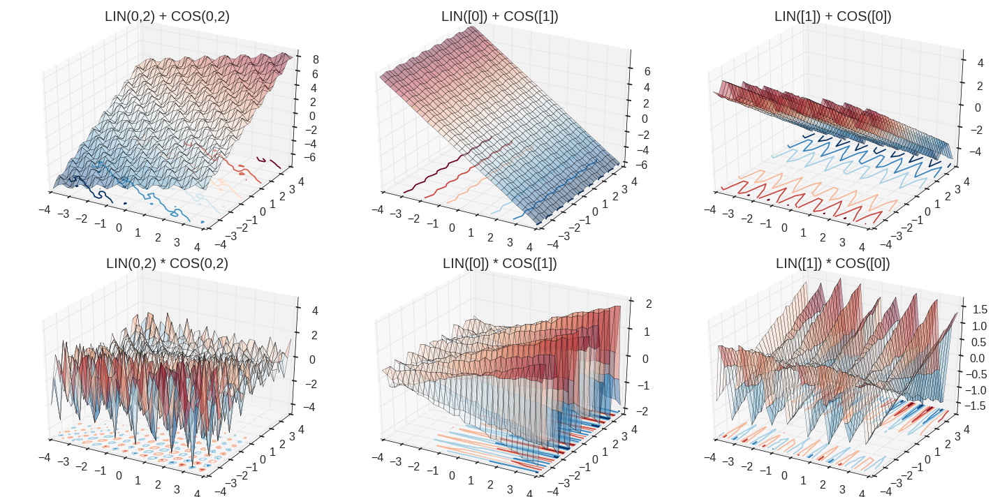

In [10]:
fig = g3.figure(figsize=[20, 10])

test_kernel_2D(g3.LIN() + g3.COS(), 231)
test_kernel_2D(g3.LIN([0]) + g3.COS([1]), 232)
test_kernel_2D(g3.LIN([1]) + g3.COS([0]), 233)


test_kernel_2D(g3.LIN() * g3.COS(), 234)
test_kernel_2D(g3.LIN([0]) * g3.COS([1]), 235)
test_kernel_2D(g3.LIN([1]) * g3.COS([0]), 236)

g3.tight_layout()